# RESNET-18

Resnet is a model used for multi-class classification
Its different from the basic model since it consists of a **skip or Residudal layer** hence the name Resnet

The skip layer allows the model to keep in check the previous output while compiling new output (to compute the new output it takes in the computed as well as the previous output).

In this Colab I have covered some additional intermediate level functionalities using **Functional API** and other minor details.

I have incorporated :

  * Custom Training
  * Check points
  * using the model as a class
  * Custom layer (to be added later)
  * tensor board
  * config file  (to be added later)

# 1) Imports

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation,Flatten,Input,Add,BatchNormalization
from keras.layers import Conv2D, MaxPooling2D,AveragePooling2D,GlobalAveragePooling2D,ReLU
import tensorflow_datasets as tfds
from tensorflow.keras.models import Model
from tensorflow.python.keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model

In [ ]:
#For Tensor board
import datetime

In [ ]:
#This code allows one to check the datasets supported by tensorflow.datasets
builders = tfds.list_builders()
print(builders)

['abstract_reasoning', 'accentdb', 'aeslc', 'aflw2k3d', 'ag_news_subset', 'ai2_arc', 'ai2_arc_with_ir', 'aloha_mobile', 'amazon_us_reviews', 'anli', 'answer_equivalence', 'arc', 'asqa', 'asset', 'assin2', 'asu_table_top_converted_externally_to_rlds', 'austin_buds_dataset_converted_externally_to_rlds', 'austin_sailor_dataset_converted_externally_to_rlds', 'austin_sirius_dataset_converted_externally_to_rlds', 'bair_robot_pushing_small', 'bc_z', 'bccd', 'beans', 'bee_dataset', 'beir', 'berkeley_autolab_ur5', 'berkeley_cable_routing', 'berkeley_fanuc_manipulation', 'berkeley_gnm_cory_hall', 'berkeley_gnm_recon', 'berkeley_gnm_sac_son', 'berkeley_mvp_converted_externally_to_rlds', 'berkeley_rpt_converted_externally_to_rlds', 'big_patent', 'bigearthnet', 'billsum', 'binarized_mnist', 'binary_alpha_digits', 'ble_wind_field', 'blimp', 'booksum', 'bool_q', 'bot_adversarial_dialogue', 'bridge', 'bridge_data_msr', 'bucc', 'c4', 'c4_wsrs', 'caltech101', 'caltech_birds2010', 'caltech_birds2011', 'c

In [ ]:
# Load the CIFAR-100 dataset
(ds_train, ds_test), ds_info = tfds.load(
    'cifar10',
    split=['train', 'test'],
    shuffle_files=True,
    as_supervised=True,  # Ensure the data is returned as (image, label) pairs
    with_info=True,
)


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/50000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cifar10/incomplete.067PW7_3.0.2/cifar10-train.tfrecord*...:   0%|         …

Generating test examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cifar10/incomplete.067PW7_3.0.2/cifar10-test.tfrecord*...:   0%|          …

Dataset cifar10 downloaded and prepared to /root/tensorflow_datasets/cifar10/3.0.2. Subsequent calls will reuse this data.


In [ ]:
print(ds_info)

tfds.core.DatasetInfo(
    name='cifar10',
    full_name='cifar10/3.0.2',
    description="""
    The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.
    """,
    homepage='https://www.cs.toronto.edu/~kriz/cifar.html',
    data_dir=PosixGPath('/tmp/tmpsb3z0k7gtfds'),
    file_format=tfrecord,
    download_size=162.17 MiB,
    dataset_size=132.40 MiB,
    features=FeaturesDict({
        'id': Text(shape=(), dtype=string),
        'image': Image(shape=(32, 32, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=10),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=10000, num_shards=1>,
        'train': <SplitInfo num_examples=50000, num_shards=1>,
    },
    citation="""@TECHREPORT{Krizhevsky09learningmultiple,
        author = {Alex Krizhevsky},
        title = {Learning mult

In [ ]:
class_names = ds_info.features['label'].names
print(class_names)

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


# 2) Preprocessing the Dataset

In [ ]:
def preprocess(image, label):
    #Resizing the image
    image = tf.image.resize(image, (32, 32))
    # Casting data to floar and Normalize pixel values to [0, 1]
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

In [ ]:
#num_parallel_calls=tf.data.experimental.AUTOTUNE is used to autocalculate level of parallelism your code supports
ds_train = ds_train.map(preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.map(preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [ ]:
#Dividing into batches
ds_train = ds_train.batch(32).prefetch(tf.data.experimental.AUTOTUNE)
ds_test = ds_test.batch(32).prefetch(tf.data.experimental.AUTOTUNE)

tf.Tensor([32 32 32  3], shape=(4,), dtype=int32)
(32, 32, 3)


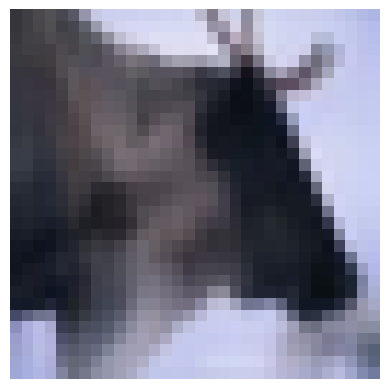

array([[[ 53,  53,  60],
        [ 63,  62,  66],
        [ 74,  72,  75],
        ...,
        [187, 194, 232],
        [179, 186, 229],
        [172, 181, 228]],

       [[ 53,  54,  60],
        [ 63,  62,  67],
        [ 74,  71,  75],
        ...,
        [193, 198, 237],
        [186, 192, 234],
        [179, 188, 234]],

       [[ 55,  55,  62],
        [ 65,  64,  68],
        [ 68,  66,  69],
        ...,
        [195, 199, 237],
        [188, 194, 234],
        [184, 191, 236]],

       ...,

       [[157, 162, 205],
        [168, 173, 215],
        [182, 188, 226],
        ...,
        [128, 132, 162],
        [100, 107, 130],
        [ 87,  97, 117]],

       [[159, 166, 211],
        [168, 175, 220],
        [179, 186, 228],
        ...,
        [145, 150, 185],
        [112, 120, 148],
        [ 90, 102, 127]],

       [[159, 167, 214],
        [167, 175, 225],
        [175, 182, 227],
        ...,
        [160, 166, 204],
        [130, 138, 175],
        [112, 123, 159]]], dtype=uint8)
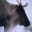

In [ ]:
def display_random_image(dataset):
    for image, label in dataset.take(1):  # Take one batch from the dataset
        print(tf.shape(image))
        image = image[0].numpy()  # Get the first image in the batch and convert to numpy
        print(image.shape)
        plt.imshow(image)  # Display the image
        plt.axis('off')  # Turn off the axis
        plt.show()  # Show the image
        image = (image * 255).astype(np.uint8)
        return image
display_random_image(ds_train)

# 3) Model Making

i) **The classical approach**

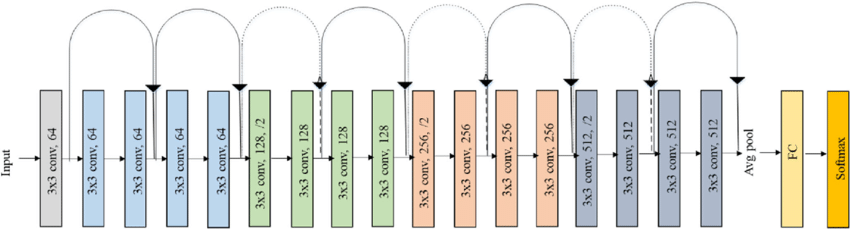

In [ ]:
def Conv_Block(x,filters,kernel,layers):
    input=x
    for i in range(layers):
        x=Conv2D(filters,kernel,padding='same',strides=(1,1),activation='relu')(x)
        x = BatchNormalization()(x)
    x=ReLU()(x)

    x=Add()([x + input])
    return ReLU()(x)

def downsample_block(x,filters,kernel,layers):
    input=x

    #Down Sampling layer : We needed to add a downsampling layer

    #Reduces image dimension by half
    x=Conv2D(filters,kernel,padding='same',strides=(2,2),activation='relu')(x)
    x = BatchNormalization()(x)
    x=ReLU()(x)
    for i in range(layers):
        x=Conv2D(filters,kernel,padding='same',strides=(1,1),activation='relu')(x)
        x = BatchNormalization()(x)
    x=ReLU()(x)

    #Shortcut Route : Used conv to change the number of filters issue
    residual = Conv2D(filters, (1, 1),strides=(2,2), padding='same')(input)  # Apply 1x1 convolution to reduce the number of filters
    x=Add()([x + residual])
    return ReLU()(x)



Notes on issue faced:
  * First simply using the shortcut with the addition route dosent work since it convolutional block essentially downsamples the input

In [ ]:

# Assuming Conv_Block is defined elsewhere

# Define the model
input = Input(shape=(32, 32,3))

# First Conv2D Layer with 'same' padding, dimensions remain (32, 32, 64)
x = Conv2D(64, (3, 3), activation='relu',padding='same')(input)
x=BatchNormalization()(x)
# MaxPooling2D Layer, reduces dimensions to approximately (11, 11, 64)
x = MaxPooling2D((3, 3),padding='same')(x)

# Two Conv Blocks with 'same' padding, dimensions remain (11, 11, 64)
x = Conv_Block(x, 64, (3, 3), 2)
x = Conv_Block(x, 64, (3, 3), 2)

# Now issue arises here since youre trying to add filter of 64 with 128 filters thats why you need that downsample block
# Downsample Block, reduces dimensions to (6, 6, 128)
x = downsample_block(x, 128, (3, 3), 2)
# Conv Block, dimensions remain (6, 6, 128)
x = Conv_Block(x, 128, (3, 3), 2)

# Downsample Block, reduces dimensions to (3, 3, 256)
x = downsample_block(x, 256, (3, 3), 2)
# Conv Block, dimensions remain (3, 3, 256)
x = Conv_Block(x, 256, (3, 3), 2)

# Downsample Block, reduces dimensions to (2, 2, 512)
x = downsample_block(x, 512, (3, 3), 2)
# Downsample Block, reduces dimensions to (2, 2, 512)
x = Conv_Block(x, 512, (3, 3), 2)

x = GlobalAveragePooling2D()(x)

x = Dense(10, activation='softmax')(x)

model = Model(inputs=input, outputs=x)


____
ii) **Class Implementation of Model**

In [ ]:
  #Questions arises: If conv1 & conv2 are the same do we need to define conv2 what if we again passes to conv1 ?
    #Answer: Since both conv layers are used to learn & extract different level of features the first extracts general level of features while the secodn extracts more minor features
  class Identity_Block(Model):
      def __init__(self,kernel,filters=64):
          super(Identity_Block,self).__init__()
          self.conv1=Conv2D(filters,kernel,padding='same',strides=(1,1),activation='relu')
          self.bn1=BatchNormalization()
          self.relu=ReLU()
          self.conv2=Conv2D(filters,kernel,padding='same',strides=(1,1),activation='relu')
          self.bn2=BatchNormalization()
          self.add=Add()

      def call(self,input_tensor):
        x=self.conv1(input_tensor)
        x=self.bn1(x)
        x=self.relu(x)
        x=self.conv2(x)
        x=self.bn2(x)
        x=self.relu(x)
        x=self.add([x + input_tensor])
        return self.relu(x)

In [ ]:
class downsample_block(Model):
    def __init__(self,kernel,filters=64):
        super(downsample_block,self).__init__()
        self.shortcut=Conv2D(filters,(1,1),padding='same',strides=(2,2),activation='relu')

        self.conv1=Conv2D(filters,kernel,padding='same',strides=(2,2),activation='relu')
        self.bn1=BatchNormalization()
        self.relu=ReLU()
        self.conv2=Conv2D(filters,kernel,padding='same',strides=(1,1),activation='relu')
        self.bn2=BatchNormalization()
        self.add=Add()
        self.bn_shortcut=BatchNormalization()

    def call(self,input):
      x=self.conv1(input)
      x=self.bn1(x)
      x=self.relu(x)
      x=self.conv2(x)
      x=self.bn2(x)
      # if layers have same spec cant we repeat them
      residual=self.shortcut(input)
      residual=self.bn_shortcut(residual)
      x=self.add([x + residual])
      return self.relu(x)

In [ ]:
class Resnet_18(Model):
    def __init__(self,filtersnum_classes=10):
        super(Resnet_18,self).__init__()

        self.conv1=Conv2D(64,(7,7),padding='same',strides=(2,2),activation='relu')
        self.bn1=BatchNormalization()
        self.maxpool=MaxPooling2D((3,3),strides=(2,2),padding='same')

        self.id1=Identity_Block((3,3),64)
        self.id2=Identity_Block((3,3),64)


        self.filters=[128,256,512]
        self.lay=[]
        for filter in self.filters:

          conv2=downsample_block((3,3),filter)
          self.lay.append(conv2)
          id3=Identity_Block((3,3),filter)
          self.lay.append(id3)


        self.pool=GlobalAveragePooling2D()
        self.dense=Dense(filtersnum_classes,activation='softmax')

    def call(self,input):
      x=self.conv1(input)
      x=self.bn1(x)
      x=self.maxpool(x)
      x=self.id1(x)
      x=self.id2(x)

      for layer in self.lay:
        x=layer(x)

      x=self.pool(x)
      x=self.dense(x)
      return x


In [ ]:
input=Input(shape=(32,32,3))
model=Resnet_18(10)
output=model(input)
model=Model(inputs=input,outputs=output)
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics='accuracy')
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 resnet_18 (Resnet_18)       (None, 10)                11196042  
                                                                 
Total params: 11196042 (42.71 MB)
Trainable params: 11186442 (42.67 MB)
Non-trainable params: 9600 (37.50 KB)
_________________________________________________________________


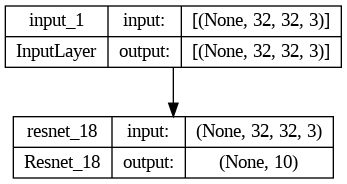

In [ ]:
plot_model(model,show_layer_names=True,show_shapes=True)   #show_shapes : displays the input and output expected shape

In [ ]:
#Training the class approach
history=model.fit(ds_train,validation_data=ds_test,epochs=10,verbose=1)

Epoch 1/10
1563/1563 [==============================] - 61s 29ms/step - loss: 1.9926 - accuracy: 0.3099 - val_loss: 1.7696 - val_accuracy: 0.3806
Epoch 2/10
1563/1563 [==============================] - 38s 24ms/step - loss: 1.5273 - accuracy: 0.4669 - val_loss: 1.5848 - val_accuracy: 0.4490
Epoch 3/10
1563/1563 [==============================] - 37s 24ms/step - loss: 1.3481 - accuracy: 0.5337 - val_loss: 1.5292 - val_accuracy: 0.4718
Epoch 4/10
1563/1563 [==============================] - 38s 24ms/step - loss: 1.2151 - accuracy: 0.5824 - val_loss: 1.2856 - val_accuracy: 0.5340
Epoch 5/10
1563/1563 [==============================] - 37s 24ms/step - loss: 1.0922 - accuracy: 0.6259 - val_loss: 1.3349 - val_accuracy: 0.5373
Epoch 6/10
1563/1563 [==============================] - 37s 24ms/step - loss: 1.0178 - accuracy: 0.6510 - val_loss: 2.0520 - val_accuracy: 0.5869
Epoch 7/10
1563/1563 [==============================] - 38s 24ms/step - loss: 0.8729 - accuracy: 0.6993 - val_loss: 1.0113 -

____

# 4) Compiling & Training of model

In [ ]:
#model compilation for normal approach
model.compile(optimizer='adam',metrics='accuracy',loss='sparse_categorical_crossentropy')

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 64)           1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 32, 32, 64)           256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 11, 11, 64)           0         ['batch_normalization[0][0

Difference between x + input and Add()([x, input])

x + input: This is element-wise addition in Python. It adds the values of the tensors directly. However, this will cause an issue if the tensors are not of the same shape.
Add()([x, input]): This is a Keras functional API layer that ensures proper broadcasting and element-wise addition. It handles tensor addition within the computational graph of the model and ensures compatibility.

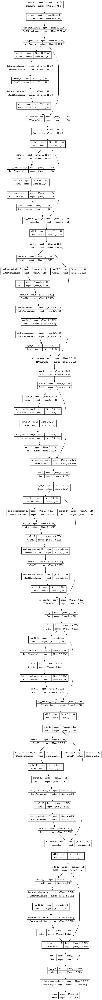

In [ ]:
plot_model(model, show_shapes=True)

In [ ]:
#Model Training
history=model.fit(ds_train,validation_data=ds_test,epochs=10,verbose=1)

Epoch 1/10
1563/1563 [==============================] - 72s 35ms/step - loss: 1.4746 - accuracy: 0.4826 - val_loss: 1.5245 - val_accuracy: 0.4874
Epoch 2/10
1563/1563 [==============================] - 48s 30ms/step - loss: 1.0191 - accuracy: 0.6422 - val_loss: 1.2832 - val_accuracy: 0.5593
Epoch 3/10
1563/1563 [==============================] - 46s 30ms/step - loss: 0.8101 - accuracy: 0.7180 - val_loss: 1.0159 - val_accuracy: 0.6537
Epoch 4/10
1563/1563 [==============================] - 46s 29ms/step - loss: 0.6757 - accuracy: 0.7661 - val_loss: 0.8899 - val_accuracy: 0.7130
Epoch 5/10
1563/1563 [==============================] - 46s 29ms/step - loss: 0.5999 - accuracy: 0.7925 - val_loss: 0.9171 - val_accuracy: 0.7136
Epoch 6/10
1563/1563 [==============================] - 47s 30ms/step - loss: 0.4531 - accuracy: 0.8425 - val_loss: 1.1183 - val_accuracy: 0.6952
Epoch 7/10
1563/1563 [==============================] - 46s 30ms/step - loss: 0.3628 - accuracy: 0.8744 - val_loss: 1.0195 -

Normal basic model: Epoch 10/10
1563/1563 [==============================] - 49s 31ms/step - loss: 0.1886 - accuracy: 0.9328 - val_loss: 1.9606 - val_accuracy: 0.7025

In [ ]:
#Tensor board Version

# Define the TensorBoard callback
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# Train the model
model.fit(ds_train, epochs=10, validation_data=ds_test, callbacks=[tensorboard_callback])



Epoch 1/10
1563/1563 [==============================] - 76s 38ms/step - loss: 1.4212 - accuracy: 0.4954 - val_loss: 1.4143 - val_accuracy: 0.5426
Epoch 2/10
1563/1563 [==============================] - 52s 33ms/step - loss: 0.9706 - accuracy: 0.6601 - val_loss: 1.2449 - val_accuracy: 0.5972
Epoch 3/10
1563/1563 [==============================] - 52s 33ms/step - loss: 0.7760 - accuracy: 0.7300 - val_loss: 1.3841 - val_accuracy: 0.5944
Epoch 4/10
1563/1563 [==============================] - 51s 33ms/step - loss: 0.6532 - accuracy: 0.7723 - val_loss: 1.0636 - val_accuracy: 0.6560
Epoch 5/10
1563/1563 [==============================] - 51s 33ms/step - loss: 0.5189 - accuracy: 0.8195 - val_loss: 1.1547 - val_accuracy: 0.6738
Epoch 6/10
1563/1563 [==============================] - 51s 33ms/step - loss: 0.4220 - accuracy: 0.8534 - val_loss: 1.0157 - val_accuracy: 0.7099
Epoch 7/10
1563/1563 [==============================] - 54s 34ms/step - loss: 0.3288 - accuracy: 0.8840 - val_loss: 0.8945 -

In [ ]:
#Tensor Board
%load_ext tensorboard
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

____
# Call backs

In [ ]:
# Callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',               # Metric to monitor
    patience=3,                      # Number of epochs to wait for improvement
    restore_best_weights=True         # Restore model weights from the epoch with the best value of the monitored metric
)

model_checkpoint = ModelCheckpoint(
    'best_model.h5',                  # Path to save the model
    monitor='val_loss',               # Metric to monitor
    save_best_only=True,               # Save only the best model based on the monitored metric
    mode='min'                        # Mode to determine whether the monitored metric should be minimized or maximized
)

history = model.fit(
    x_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(x_val, y_val),
    callbacks=[early_stopping, model_checkpoint]
)

____

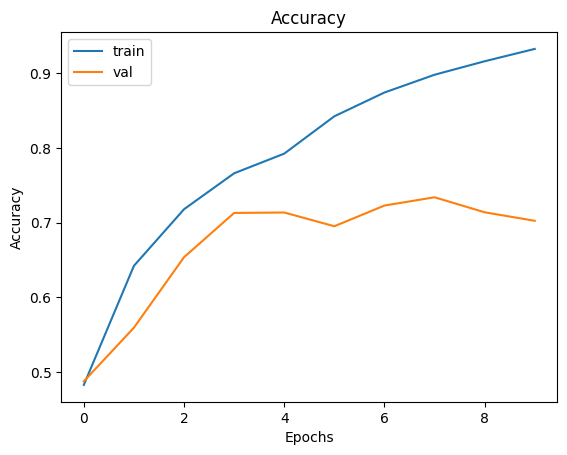

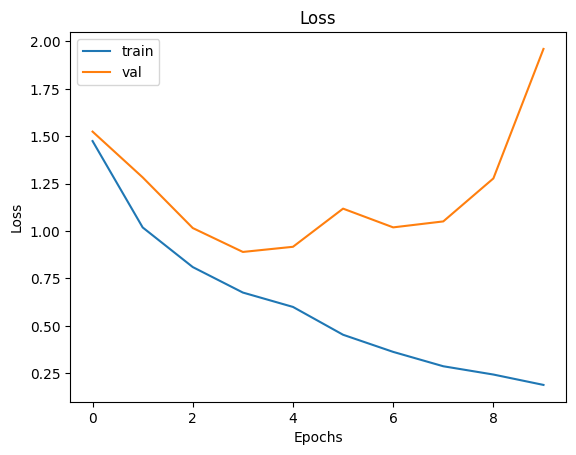

In [ ]:
epochs=10
plt.plot(range(epochs),history.history['accuracy'],label='train')
plt.plot(range(epochs),history.history['val_accuracy'],label='val')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
plt.plot(range(epochs),history.history['loss'],label='train')
plt.plot(range(epochs),history.history['val_loss'],label='val')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

___

In [ ]:
import numpy as np

# Get a random sample from the test set
test_images, test_labels = next(iter(ds_test.unbatch().batch(10000)))
random_index = np.random.randint(0, test_images.shape[0])
random_image = test_images[random_index]
random_label = test_labels[random_index]


In [ ]:
# Expand dimensions of the image to match input shape of the model
random_image_expanded = tf.expand_dims(random_image, axis=0)

# Get model prediction
predicted_probs = model.predict(random_image_expanded)
predicted_class = tf.argmax(predicted_probs, axis=1).numpy()[0]


1/1 [==============================] - 0s 19ms/step


In [ ]:
# CIFAR-10 class names
class_names = ds_info.features['label'].names

# Get the class name
predicted_class_name = class_names[predicted_class]
true_class_name = class_names[random_label.numpy()]

print(f"Predicted class: {predicted_class_name}")
print(f"True class: {true_class_name}")


Predicted class: cat
True class: cat


In [ ]:
model.save('Resnet-18-Cifar10-0.93,0.7.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
